In [1]:
# Import packages

import pandas as pd
import numpy as np
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

# Read in the data

df = pd.read_csv(r'C:\Users\Shannon\Desktop\movies.csv')

In [2]:
# looking at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72


In [3]:
# Look for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 0%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 0%
gross - 0%
company - 0%
runtime - 0%


In [4]:
# See what data types are used

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes         int64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime       int64
dtype: object

In [5]:
# Change data types

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')


In [6]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5426,Heaven's Gate,R,Adventure,1980,"April 24, 1981 (United States)",6.8,14000,Michael Cimino,Michael Cimino,Kris Kristofferson,United States,44000000,3484523,Partisan Productions,219
5427,Gods and Generals,PG-13,Biography,2003,"February 21, 2003 (United States)",6.3,16000,Ron Maxwell,Jeff Shaara,Stephen Lang,United States,56000000,12923936,Turner Pictures (I),219
5428,Once Upon a Time in America,R,Crime,1984,"June 1, 1984 (United States)",8.4,321000,Sergio Leone,Harry Grey,Robert De Niro,Italy,30000000,5473212,The Ladd Company,229
5429,Hamlet,PG-13,Drama,1996,"December 25, 1996 (United States)",7.7,37000,Kenneth Branagh,William Shakespeare,Kenneth Branagh,United Kingdom,18000000,4770222,Castle Rock Entertainment,242


In [7]:
# Correct the Released Year column

df['correctedreleaseyear'] = df['released'].astype(str).str[:4]

df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63,July
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69,Nove
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69,Nove
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71,June
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72,Febr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5426,Heaven's Gate,R,Adventure,1980,"April 24, 1981 (United States)",6.8,14000,Michael Cimino,Michael Cimino,Kris Kristofferson,United States,44000000,3484523,Partisan Productions,219,Apri
5427,Gods and Generals,PG-13,Biography,2003,"February 21, 2003 (United States)",6.3,16000,Ron Maxwell,Jeff Shaara,Stephen Lang,United States,56000000,12923936,Turner Pictures (I),219,Febr
5428,Once Upon a Time in America,R,Crime,1984,"June 1, 1984 (United States)",8.4,321000,Sergio Leone,Harry Grey,Robert De Niro,Italy,30000000,5473212,The Ladd Company,229,June
5429,Hamlet,PG-13,Drama,1996,"December 25, 1996 (United States)",7.7,37000,Kenneth Branagh,William Shakespeare,Kenneth Branagh,United Kingdom,18000000,4770222,Castle Rock Entertainment,242,Dece


In [8]:
# Doing it a different way

df['yearcorrect'] = df['released'].str.extract(pat = '([0-9]{4})').astype(int)

In [9]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63,July,2011
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69,Nove,1988
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69,Nove,1999
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71,June,1993
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72,Febr,2002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5426,Heaven's Gate,R,Adventure,1980,"April 24, 1981 (United States)",6.8,14000,Michael Cimino,Michael Cimino,Kris Kristofferson,United States,44000000,3484523,Partisan Productions,219,Apri,1981
5427,Gods and Generals,PG-13,Biography,2003,"February 21, 2003 (United States)",6.3,16000,Ron Maxwell,Jeff Shaara,Stephen Lang,United States,56000000,12923936,Turner Pictures (I),219,Febr,2003
5428,Once Upon a Time in America,R,Crime,1984,"June 1, 1984 (United States)",8.4,321000,Sergio Leone,Harry Grey,Robert De Niro,Italy,30000000,5473212,The Ladd Company,229,June,1984
5429,Hamlet,PG-13,Drama,1996,"December 25, 1996 (United States)",7.7,37000,Kenneth Branagh,William Shakespeare,Kenneth Branagh,United Kingdom,18000000,4770222,Castle Rock Entertainment,242,Dece,1996


In [10]:
# Order by gross revenue

df = df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
5358,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162,Dece,2009
5404,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181,Apri,2019
5419,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194,Dece,1997
5106,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,Dece,2015
5283,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,Apri,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1640,Philadelphia Experiment II,PG-13,Action,1993,"June 4, 1994 (South Korea)",4.5,1900,Stephen Cornwell,Wallace C. Bennett,Brad Johnson,United States,5000000,2970,Trimark Pictures,97,June,1994
3075,Ginger Snaps,Not Rated,Drama,2000,"May 11, 2001 (Canada)",6.8,43000,John Fawcett,Karen Walton,Emily Perkins,Canada,5000000,2554,Copperheart Entertainment,108,May,2001
226,Parasite,R,Horror,1982,"March 12, 1982 (United States)",3.9,2300,Charles Band,Alan J. Adler,Robert Glaudini,United States,800000,2270,Embassy Pictures,85,Marc,1982
4986,Madadayo,Unrated,Drama,1993,"April 17, 1993 (Japan)",7.3,5100,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134,Apri,1993


In [11]:
# Look at all of the data

pd.set_option('display.max_rows', None)

In [12]:
# Drop any duplicates

df['company'].drop_duplicates().sort_values(ascending=False)

574                                               thefyzz
4881                                          micro_scope
2175                                             i5 Films
2430                                           i am OTHER
1401                                                 erbp
3536                                       double A Films
2501                          Zucker Brothers Productions
841                                      Zoetrope Studios
1664                                   Zeta Entertainment
3180                              Zentropa Entertainments
959                                  Zenith Entertainment
3871                                      Zazen Produções
3965                             Zanuck/Brown Productions
840                           Zacharias-Buhai Productions
2103                            Young Sung Production Co.
4366                           Young Hannibal Productions
5306                                          Yellow Bird
5417          

In [13]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63,July,2011
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69,Nove,1988
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69,Nove,1999
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71,June,1993
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72,Febr,2002
5,The Jungle Book 2,G,Animation,2003,"February 14, 2003 (United States)",5.4,15000,Steve Trenbirth,Karl Geurs,John Goodman,United States,20000000,186303759,Disney Television Animation,72,Febr,2003
6,The Adventures of Elmo in Grouchland,G,Adventure,1999,"October 1, 1999 (United States)",5.8,3100,Gary Halvorson,Mitchell Kriegman,Kevin Clash,United States,26000000,11683047,Jim Henson Pictures,73,Octo,1999
7,Clifford's Really Big Movie,G,Animation,2004,"April 23, 2004 (United States)",5.4,822,Robert C. Ramirez,Rhett Reese,John Ritter,United States,70000,3255426,Big Red Dog Productions,74,Apri,2004
8,The Pebble and the Penguin,G,Animation,1995,"April 12, 1995 (United States)",5.6,4700,Don Bluth,Rachel Koretsky,Martin Short,Ireland,28000000,3983912,Metro-Goldwyn-Mayer (MGM),74,Apri,1995
9,Oliver & Company,G,Animation,1988,"November 18, 1988 (United States)",6.7,45000,George Scribner,Jim Cox,Joey Lawrence,United States,31000000,74151346,Walt Disney Animation Studios,74,Nove,1988


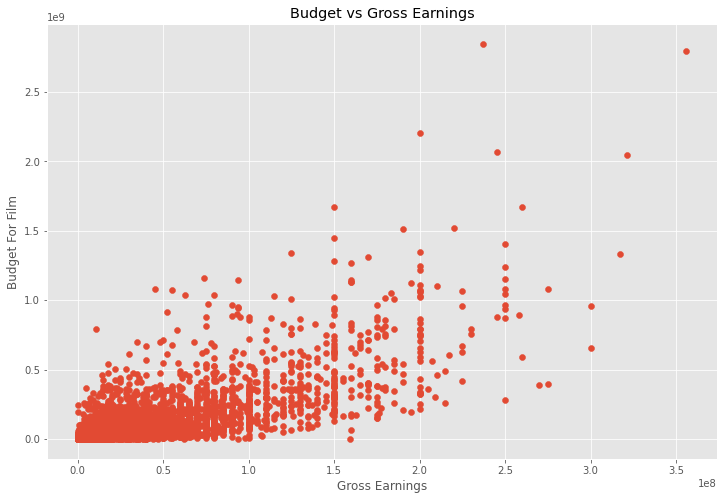

In [36]:
# Compare budget to gross revenue with scatter plot to see if there is a correlation

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earnings')

plt.ylabel('Budget For Film')

plt.show()



In [15]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63,July,2011
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69,Nove,1988
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69,Nove,1999
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71,June,1993
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72,Febr,2002


<AxesSubplot:xlabel='budget', ylabel='gross'>

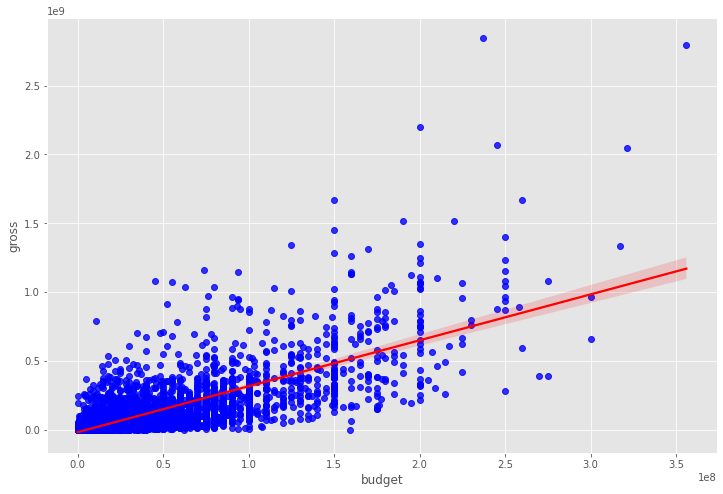

In [26]:
# Create regression plot of budget vs gross via Seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={'color':'blue'}, line_kws={'color':'red'})

In [30]:
# Explore all correlations- pearson, kendall, spearman

df.corr(method='pearson')

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.000000,0.055606,0.205819,0.327751,0.274396,0.074713,0.998650
score,0.055606,1.000000,0.473788,0.071707,0.222039,0.414489,0.061389
votes,0.205819,0.473788,1.000000,0.439871,0.614815,0.352328,0.202932
budget,0.327751,0.071707,0.439871,1.000000,0.740357,0.318445,0.320208
gross,0.274396,0.222039,0.614815,0.740357,1.000000,0.275478,0.268738
runtime,0.074713,0.414489,0.352328,0.318445,0.275478,1.000000,0.074923
yearcorrect,0.998650,0.061389,0.202932,0.320208,0.268738,0.074923,1.000000


In [31]:
# High correlation is seen between budget and gross revenue! 



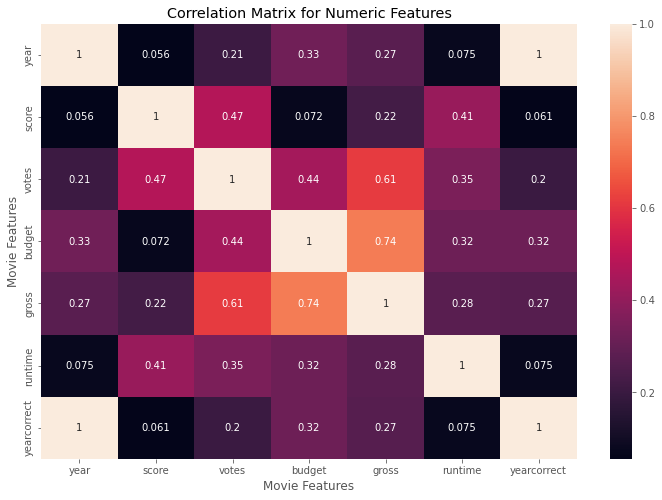

In [37]:
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')

plt.show()

In [38]:
# Explore companies

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
0,Winnie the Pooh,G,Animation,2011,"July 15, 2011 (United States)",7.2,23000,Stephen J. Anderson,Stephen J. Anderson,Jim Cummings,United States,30000000,49871429,Walt Disney Pictures,63,July,2011
1,The Land Before Time,G,Animation,1988,"November 18, 1988 (United States)",7.4,82000,Don Bluth,Stu Krieger,Pat Hingle,United States,12500000,84460846,Lucasfilm,69,Nove,1988
2,Following,R,Crime,1998,"November 5, 1999 (United Kingdom)",7.5,89000,Christopher Nolan,Christopher Nolan,Jeremy Theobald,United Kingdom,6000,48482,Next Wave Films,69,Nove,1999
3,Once Upon a Forest,G,Animation,1993,"June 18, 1993 (United States)",6.5,5200,Charles Grosvenor,Rae Lambert,Michael Crawford,United Kingdom,13000000,6582052,Hanna-Barbera Productions,71,June,1993
4,Peter Pan 2: Return to Never Land,G,Animation,2002,"February 15, 2002 (United States)",5.8,19000,Robin Budd,Temple Mathews,Blayne Weaver,United States,20000000,115121981,Disney Television Animation,72,Febr,2002


In [39]:
# Give columns with names a number instead

df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
0,5258,1,2,2011,1096,7.2,23000,1815,2834,833,47,30000000,49871429,1427,63,10,2011
1,4353,1,2,1988,2004,7.4,82000,495,2896,1351,47,12500000,84460846,947,69,14,1988
2,1464,6,5,1998,2118,7.5,89000,319,517,813,46,6000,48482,1055,69,14,1999
3,2843,1,2,1993,1345,6.5,5200,267,2459,1225,46,13000000,6582052,763,71,11,1993
4,2971,1,2,2002,719,5.8,19000,1679,2938,177,47,20000000,115121981,533,72,8,2002
5,4332,1,2,2003,709,5.4,15000,1847,1690,875,47,20000000,186303759,533,72,8,2003
6,3857,1,1,1999,2159,5.8,3100,627,2191,1011,47,26000000,11683047,869,73,15,1999
7,873,1,2,2004,116,5.4,822,1650,2490,887,47,70000,3255426,244,74,5,2004
8,4558,1,2,1995,29,5.6,4700,495,2457,1174,22,28000000,3983912,1003,74,5,1995
9,2833,1,2,1988,2004,6.7,45000,660,1418,859,47,31000000,74151346,1426,74,14,1988


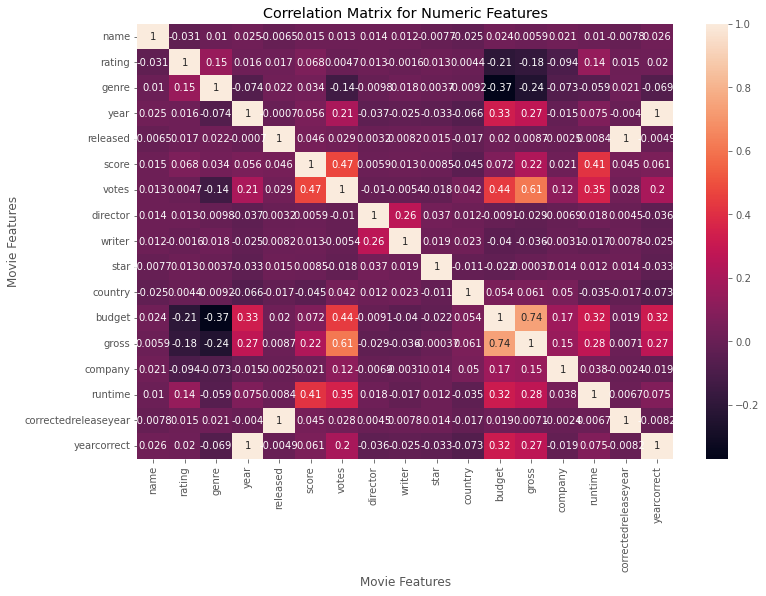

In [40]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')

plt.show()

In [41]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctedreleaseyear,yearcorrect
name,1.000000,-0.030538,0.010408,0.025282,-0.006496,0.014610,0.012876,0.013900,0.011562,-0.007700,-0.025451,0.023724,0.005946,0.021484,0.010328,-0.007785,0.025509
rating,-0.030538,1.000000,0.151311,0.016485,0.017461,0.067735,0.004744,0.013481,-0.001639,0.012653,0.004438,-0.205991,-0.182886,-0.094188,0.141301,0.014994,0.019756
genre,0.010408,0.151311,1.000000,-0.073737,0.022116,0.034416,-0.136378,-0.009779,0.017778,0.003735,-0.009230,-0.368930,-0.244424,-0.073171,-0.059412,0.021375,-0.069478
year,0.025282,0.016485,-0.073737,1.000000,-0.000702,0.055606,0.205819,-0.037073,-0.025359,-0.032618,-0.065632,0.327751,0.274396,-0.014554,0.074713,-0.004008,0.998650
released,-0.006496,0.017461,0.022116,-0.000702,1.000000,0.045956,0.029142,0.003241,0.008180,0.015045,-0.017108,0.020196,0.008724,-0.002455,0.008428,0.996187,-0.004942
score,0.014610,0.067735,0.034416,0.055606,0.045956,1.000000,0.473788,0.005857,0.012940,0.008457,-0.044928,0.071707,0.222039,0.020699,0.414489,0.045137,0.061389
votes,0.012876,0.004744,-0.136378,0.205819,0.029142,0.473788,1.000000,-0.009986,-0.005362,-0.017561,0.041813,0.439871,0.614815,0.118909,0.352328,0.027831,0.202932
director,0.013900,0.013481,-0.009779,-0.037073,0.003241,0.005857,-0.009986,1.000000,0.262980,0.036866,0.011716,-0.009113,-0.029196,-0.006884,0.018381,0.004457,-0.036380
writer,0.011562,-0.001639,0.017778,-0.025359,0.008180,0.012940,-0.005362,0.262980,1.000000,0.019135,0.022702,-0.039529,-0.035995,-0.003107,-0.016666,0.007765,-0.025157
star,-0.007700,0.012653,0.003735,-0.032618,0.015045,0.008457,-0.017561,0.036866,0.019135,1.000000,-0.011313,-0.021781,-0.000370,0.014277,0.011684,0.014241,-0.033067


In [42]:
correlation_matrix = df_numerized.corr()

corr_pairs = correlation_matrix.unstack()

corr_pairs

name                  name                    1.000000
                      rating                 -0.030538
                      genre                   0.010408
                      year                    0.025282
                      released               -0.006496
                      score                   0.014610
                      votes                   0.012876
                      director                0.013900
                      writer                  0.011562
                      star                   -0.007700
                      country                -0.025451
                      budget                  0.023724
                      gross                   0.005946
                      company                 0.021484
                      runtime                 0.010328
                      correctedreleaseyear   -0.007785
                      yearcorrect             0.025509
rating                name                   -0.030538
          

In [43]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

budget                genre                  -0.368930
genre                 budget                 -0.368930
                      gross                  -0.244424
gross                 genre                  -0.244424
budget                rating                 -0.205991
rating                budget                 -0.205991
gross                 rating                 -0.182886
rating                gross                  -0.182886
genre                 votes                  -0.136378
votes                 genre                  -0.136378
rating                company                -0.094188
company               rating                 -0.094188
genre                 year                   -0.073737
year                  genre                  -0.073737
company               genre                  -0.073171
genre                 company                -0.073171
country               yearcorrect            -0.072687
yearcorrect           country                -0.072687
          

In [44]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

gross                 votes                   0.614815
votes                 gross                   0.614815
budget                gross                   0.740357
gross                 budget                  0.740357
released              correctedreleaseyear    0.996187
correctedreleaseyear  released                0.996187
year                  yearcorrect             0.998650
yearcorrect           year                    0.998650
name                  name                    1.000000
writer                writer                  1.000000
runtime               runtime                 1.000000
company               company                 1.000000
gross                 gross                   1.000000
budget                budget                  1.000000
country               country                 1.000000
star                  star                    1.000000
director              director                1.000000
votes                 votes                   1.000000
score     

In [ ]:
# Found out that budget and votes have the highest correlation in gross earnings